Исследование: "Рынок заведений общественного питания Москвы"

<div class="alert alert-info"> 
<b></b> 
    




Контекст: Инвесторы хотят открыть точку общественного питания в Москве.
Цель: дать ответ на генеральный вопрос исследования - смогут ли инвесторы открыть аналог "Central Perk" в Москве.
Задача: Подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
Ход исследования:
1. Знакомство с данными.
2. Предобработка.
3. Анализ данных.
4. Анализ даннных о кофейнях.
    
</div>

---

Шаг 1. Загрузите данные и изучите общую информацию

In [1]:
#Импортируем библиотеки
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Открываем файл
data = pd.read_csv('/datasets/moscow_places.csv')
display (data.head(5))
display (data.info())
#сразу посмотрим дубликаты
display (data.duplicated().sum())
display (data.isna().sum())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

0

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Файл содержит информацию о 8 406 объектах общественного питания. Дубликатов в данных нет.
Много пропусков в данных по количеству посадочных мест и по среднему чеку.

name — название заведения;
address — адрес заведения;
category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
hours — информация о днях и часах работы;
lat — широта географической точки, в которой находится заведение;
lng — долгота географической точки, в которой находится заведение;
rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
«Средний счёт: 1000–1500 ₽»;
«Цена чашки капучино: 130–220 ₽»;
«Цена бокала пива: 400–600 ₽». и так далее;
middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
0 — заведение не является сетевым
1 — заведение является сетевым
district — административный район, в котором находится заведение, например Центральный административный округ;
seats — количество посадочных мест.

Шаг 2. Выполните предобработку данных

Заполнять пропуски в данном датасете означало бы исказить информацию. Единственное, возможно в seats NaN заменить на 0 (там уже итак есть нули). Но я тоже не уверена, что это корректно.

In [3]:
#заполняем пропуск в seats нулями
data['seats']=data['seats'].fillna(0)
display (data.isna().sum())

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                   0
dtype: int64

In [4]:
pd.DataFrame(round(data.isna().mean()*100,1)).style.background_gradient('coolwarm')

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.400000
lat,0.000000
lng,0.000000
rating,0.000000
price,60.600000
avg_bill,54.600000


In [5]:
#поищем дубликаты
print (data.duplicated().sum())
#нет
display (data['category'].unique())
#нет
duplicateRows = data[data.duplicated(['address','name'])]
display (duplicateRows)
#Тоже нет

0


array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


In [6]:
#Создайте столбец street с названиями улиц из столбца с адресом.
def street_cut(row):
    address = row['address'].split(', ')
    street = address[1]
    return street
data['street_name'] = data.apply(street_cut, axis=1)
display (data.info())
display (data.head(5))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              8406 non-null   float64
 14  street_name        8406 non-null   object 
dtypes: float64(6), int64(1), object(8)
memory usage: 985.2+ KB


None

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street_name
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,0.0,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,0.0,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


In [7]:
#* Создайте столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
#логическое значение True — если заведение работает ежедневно и круглосуточно;
#логическое значение False — в противоположном случае.
print (data['hours'].unique())
data['is_24/7']=data['hours']=='ежедневно, круглосуточно'
display (data.tail(10))

['ежедневно, 10:00–22:00'
 'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00'
 'ежедневно, 09:00–22:00' ... 'пн-пт 08:30–21:30; сб,вс 09:00–21:30'
 'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00'
 'пн-сб 10:30–21:30']


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street_name,is_24/7
8396,Пекинский Двор,ресторан,"Москва, Ленинский проспект, 158",Западный административный округ,"ежедневно, 11:00–23:00",55.651706,37.482667,4.3,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,0,200.0,Ленинский проспект,False
8397,Траектория Крафт-Кафе,пиццерия,"Москва, улица Лобачевского, 52, корп. 1",Западный административный округ,"пн-пт 10:00–23:00; сб,вс 12:00–23:00",55.672011,37.492628,4.4,средние,NaN,NaN,NaN,0,60.0,улица Лобачевского,False
8398,На Волгина,кафе,"Москва, улица Академика Волгина, 2А",Юго-Западный административный округ,"ежедневно, 09:00–23:00",55.654933,37.521421,4.4,NaN,NaN,NaN,NaN,0,49.0,улица Академика Волгина,False
8399,"Пекарня, кафе-гриль",булочная,"Москва, Болотниковская улица, 52, корп. 2",Юго-Западный административный округ,"ежедневно, круглосуточно",55.662866,37.582572,4.2,NaN,Средний счёт:50–250 ₽,150.0,NaN,0,50.0,Болотниковская улица,True
8400,Практика Кофе,кофейня,"Москва, Чонгарский бульвар, 26А, корп. 1",Юго-Западный административный округ,"пн-пт 08:00–22:00; сб,вс 09:00–22:00",55.654289,37.600722,4.4,NaN,NaN,NaN,NaN,0,55.0,Чонгарский бульвар,False
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Профсоюзная улица,False
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,Пролетарский проспект,False
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица,True
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,Люблинская улица,True
8405,Kebab Time,кафе,"Москва, Россошанский проезд, 6",Южный административный округ,"ежедневно, круглосуточно",55.598229,37.604702,3.9,NaN,NaN,NaN,NaN,0,12.0,Россошанский проезд,True


<div class="alert alert-info"> 
<b></b> 
    
Дубликатов нет
    
</div>

---

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

,category,name
0,кафе,2378
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


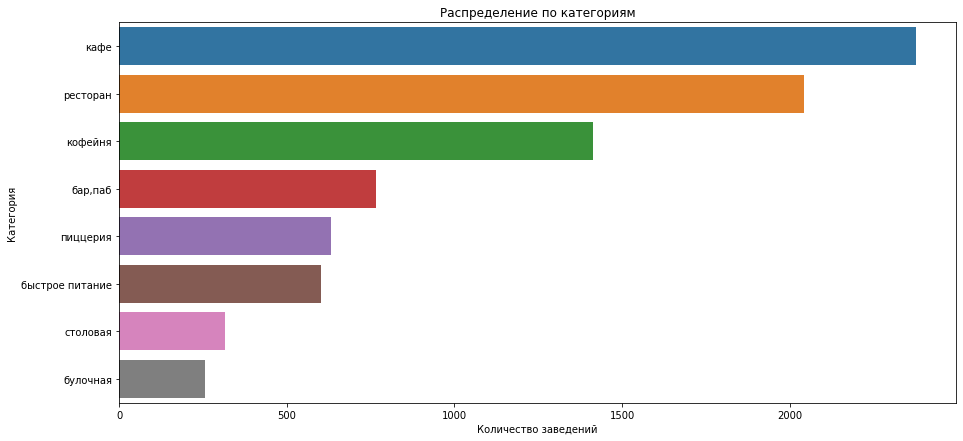

In [8]:
#Какие категории заведений представлены в данных? 
#Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. 
display (data['category'].unique())
display (data.groupby('category')['name'].count().sort_values(ascending=False).reset_index())

#Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.
category_groups=data.groupby('category')['name'].count().sort_values(ascending=False).reset_index()
plt.figure(figsize=(15, 7))
sns.barplot(x='name', y='category', data=category_groups)
plt.title('Распределение по категориям')
plt.xlabel('Количество заведений')
plt.ylabel('Категория')
plt.show()

Всего 8 различных категорий. Больше всего - кафе (2378).
Наименее популярный формат - булочная.

,category,seats
0,ресторан,43.0
1,"бар,паб",40.0
2,пиццерия,30.0
3,быстрое питание,10.0
4,булочная,9.0
5,кофейня,6.0
6,столовая,6.0
7,кафе,0.0


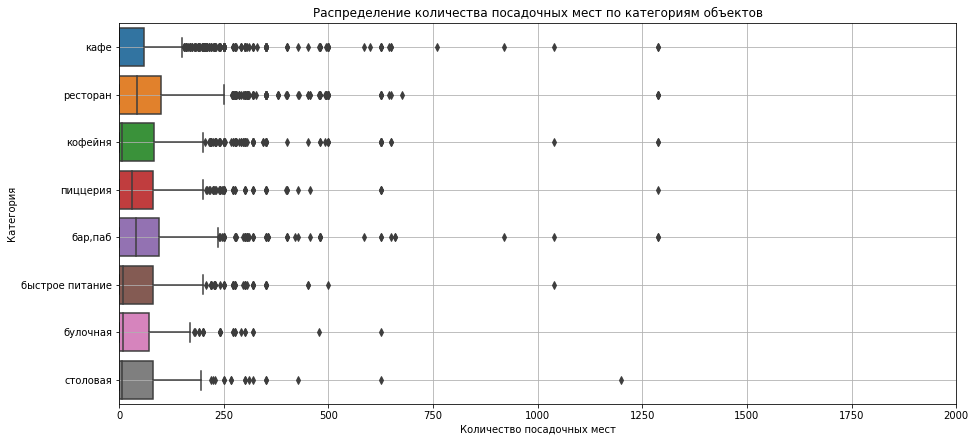

In [9]:
#Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. 
#Постройте визуализации. Проанализируйте результаты и сделайте выводы.
display (data.groupby('category')['seats'].median().sort_values(ascending=False).reset_index())

plt.figure(figsize=(15, 7))
sns.boxplot(x='seats', y='category', data=data) 
plt.xlabel('Количество посадочных мест')
plt.ylabel('Категория')
plt.xlim(0, 2000)
plt.grid()
plt.title('Распределение количества посадочных мест по категориям объектов')
plt.show()


Владельцы кафе редко указывали видимо количество посадочных мест. 
На первой диаграмме видно, что количество мест превышает 1250. Предлагаю считать все значения выше 500 = выбросами и убрать их.

count    8406.000000
mean       61.846538
std       107.175995
min         0.000000
5%          0.000000
44%         0.000000
50%        20.000000
75%        85.000000
95%       250.000000
99%       490.500000
max      1288.000000
Name: seats, dtype: float64

,category,seats
0,"бар,паб",40.0
1,ресторан,40.0
2,пиццерия,30.0
3,булочная,8.0
4,быстрое питание,8.0
5,кофейня,5.0
6,столовая,4.0
7,кафе,0.0


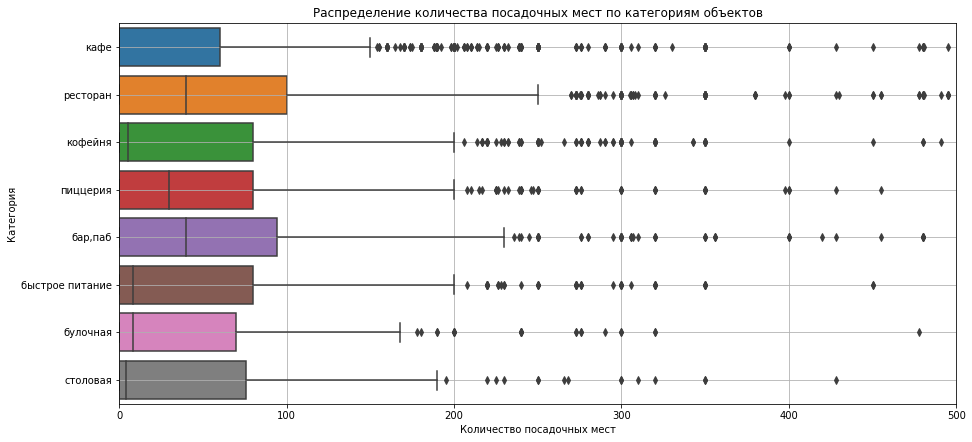

In [10]:
#проверим, сколько мы потеряем
display (data['seats'].describe(percentiles=[0.05, 0.44, 1/2, 3/4, 0.95, 0.99]))
#менее 1 %
data=data.query('seats < 500')
#и проверим как данные обновились
display (data.groupby('category')['seats'].median().sort_values(ascending=False).reset_index())

plt.figure(figsize=(15, 7))
sns.boxplot(x='seats', y='category', data=data) 
plt.xlabel('Количество посадочных мест')
plt.ylabel('Категория')
plt.xlim(0, 500)
plt.grid()
plt.title('Распределение количества посадочных мест по категориям объектов')
plt.show()

У 44% заведений не заполнена информация о количестве посадочныз мест, либо она =0.
В 95% в заведения менее 240 посадлочных мест. В среднем на 1 заведение приходится 55 мест. Выбросы, конечно, остались (булочная на 400 мест, например), но уже лучше.

In [11]:
#Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?
chain_type = data.groupby('chain')['name'].count().sort_values(ascending=False).reset_index()
chain_type

,chain,name
0,0,5158
1,1,3171


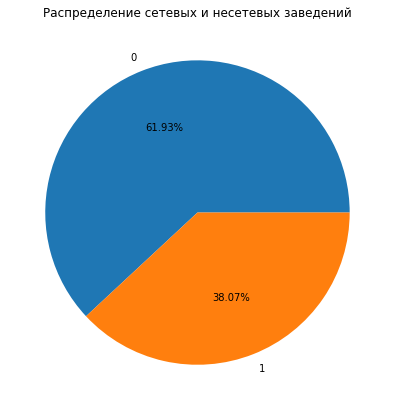

In [12]:
plt.figure(figsize = (7, 7))
plt.pie(chain_type.name, labels=chain_type.chain, autopct='%1.2f%%')
plt.title('Распределение сетевых и несетевых заведений')
plt.show()

Вывод: несетевых больше

chain,category,0,1,all,% chain
1,булочная,99,156,255,0.611765
5,пиццерия,301,328,629,0.521463
4,кофейня,687,711,1398,0.508584
2,быстрое питание,370,231,601,0.384359
6,ресторан,1302,720,2022,0.356083
3,кафе,1586,770,2356,0.326825
7,столовая,226,87,313,0.277955
0,"бар,паб",587,168,755,0.222517


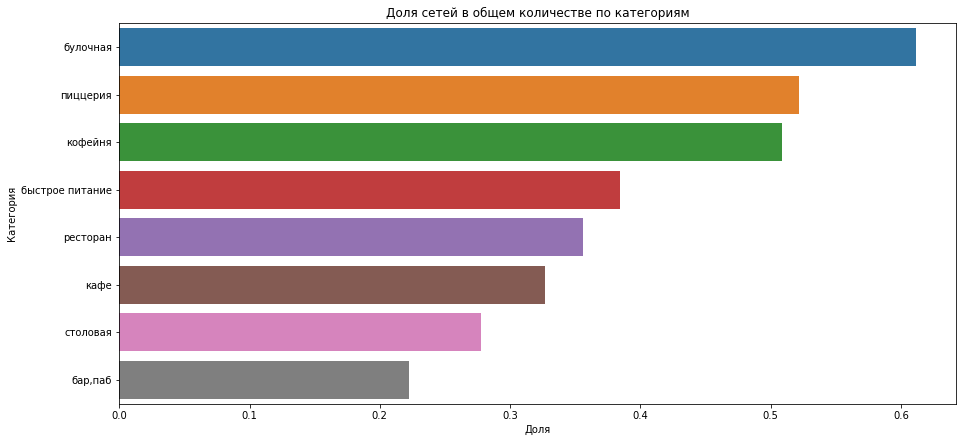

In [13]:
#Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.
chains = data.pivot_table(index = 'category', values='name', columns = 'chain', aggfunc='count').reset_index()
chains['all'] = chains[1] + chains[0]
chains['% chain'] = chains[1] / chains['all']
chains = chains.sort_values(by='% chain', ascending=False)
display(chains)

plt.figure(figsize=(15, 7))
sns.barplot(x='% chain', y='category', data=chains)
plt.title('Доля сетей в общем количестве по категориям')
plt.xlabel('Доля')
plt.ylabel('Категория')
plt.show()

Больше всего сетевых заведений среди булочных, пиццерий, кофеен.

In [14]:
#Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. 
#Под популярностью понимается количество заведений этой сети в регионе. 
#Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? 
#Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?
chains_new=data.query('chain==1')
chains_new=chains_new.pivot_table(index = ('name','category'), values='chain', aggfunc='count').sort_values(by='chain', ascending=False).reset_index()
chains_new.head(15)

,name,category,chain
0,Шоколадница,кофейня,117
1,Домино'с Пицца,пиццерия,76
2,Додо Пицца,пиццерия,74
3,One Price Coffee,кофейня,70
4,Яндекс Лавка,ресторан,68
5,Cofix,кофейня,65
6,Prime,ресторан,49
7,КОФЕПОРТ,кофейня,42
8,Кулинарная лавка братьев Караваевых,кафе,38
9,Теремок,ресторан,36


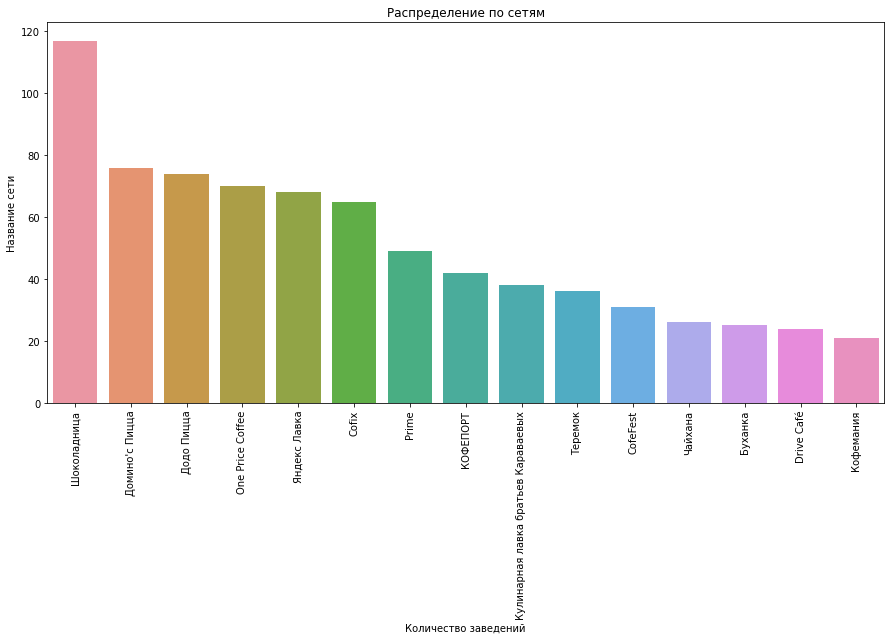

In [15]:
chains_top15=chains_new.head(15)
plt.figure(figsize=(15, 7))
ax=sns.barplot(x='name', y='chain', data=chains_top15)
plt.title('Распределение по сетям')
plt.xlabel('Количество заведений')
plt.ylabel('Название сети')
plt.xticks(rotation=90)
plt.show()

Все заведения "на слуху". В основн это Кофейни, кафе и рестораны.

In [16]:
#Какие административные районы Москвы присутствуют в датасете? 
#Отобразите общее количество заведений и количество заведений каждой категории по районам. 
#Попробуйте проиллюстрировать эту информацию одним графиком.
display (data['district'].unique())
district=data.pivot_table(index = ('district'), values='name', aggfunc='count').sort_values(by='name', ascending = False).reset_index()
display (district)
district_1=data.pivot_table(index = ('district','category'), values='name', aggfunc='count').reset_index()
display (district_1)
district_2 = data.pivot_table(index = 'district', values='name', columns = 'category', aggfunc='count').reset_index()
district_2['total']=district_2['бар,паб']+district_2['булочная']+district_2['быстрое питание']+district_2['кафе']+district_2['кофейня']+district_2['пиццерия']+district_2['ресторан']+district_2['столовая']
district_2=district_2.sort_values(by='total', ascending = False)
display (district_2)

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

,district,name
0,Центральный административный округ,2225
1,Южный административный округ,891
2,Северо-Восточный административный округ,888
3,Северный административный округ,877
4,Западный административный округ,831
5,Восточный административный округ,789
6,Юго-Восточный административный округ,713
7,Юго-Западный административный округ,706
8,Северо-Западный административный округ,409


,district,category,name
0,Восточный административный округ,"бар,паб",49
1,Восточный административный округ,булочная,25
2,Восточный административный округ,быстрое питание,70
3,Восточный административный округ,кафе,269
4,Восточный административный округ,кофейня,104
...,...,...,...
67,Южный административный округ,кафе,264
68,Южный административный округ,кофейня,131
69,Южный административный округ,пиццерия,73
70,Южный административный округ,ресторан,201


category,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
5,Центральный административный округ,364,50,86,459,425,113,662,66,2225
8,Южный административный округ,68,25,85,264,131,73,201,44,891
3,Северо-Восточный административный округ,63,28,82,266,159,68,182,40,888
2,Северный административный округ,66,38,58,231,186,74,184,40,877
1,Западный административный округ,46,37,62,234,146,70,213,23,831
0,Восточный административный округ,49,25,70,269,104,72,160,40,789
6,Юго-Восточный административный округ,38,13,67,282,89,55,144,25,713
7,Юго-Западный административный округ,38,27,61,236,96,64,167,17,706
4,Северо-Западный административный округ,23,12,30,115,62,40,109,18,409


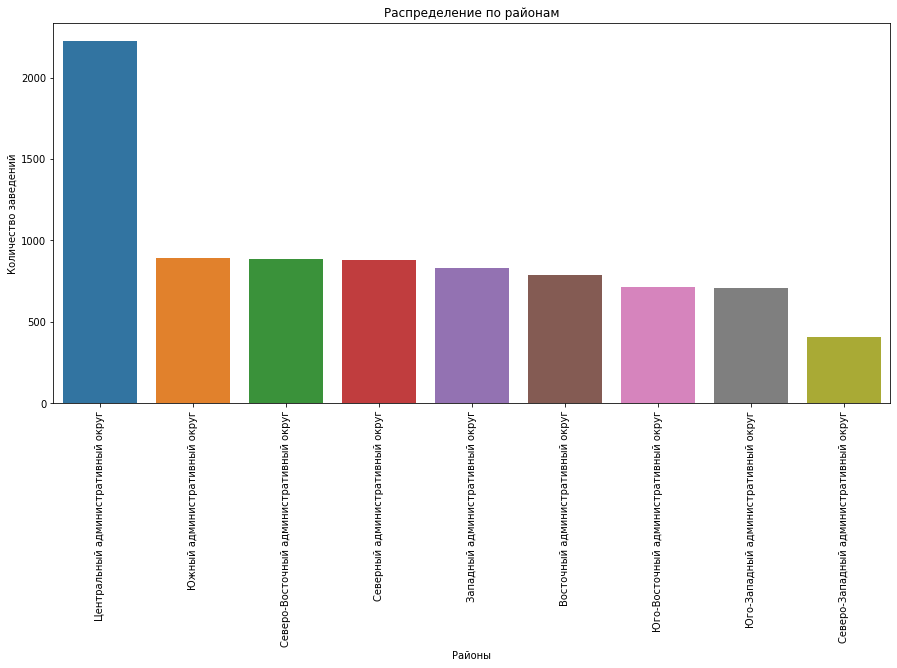

In [17]:
plt.figure(figsize=(15, 7))
ax=sns.barplot(x='district', y='name', data=district)
plt.title('Распределение по районам')
plt.xlabel('Районы')
plt.ylabel('Количество заведений')
plt.xticks(rotation=90)
plt.show()


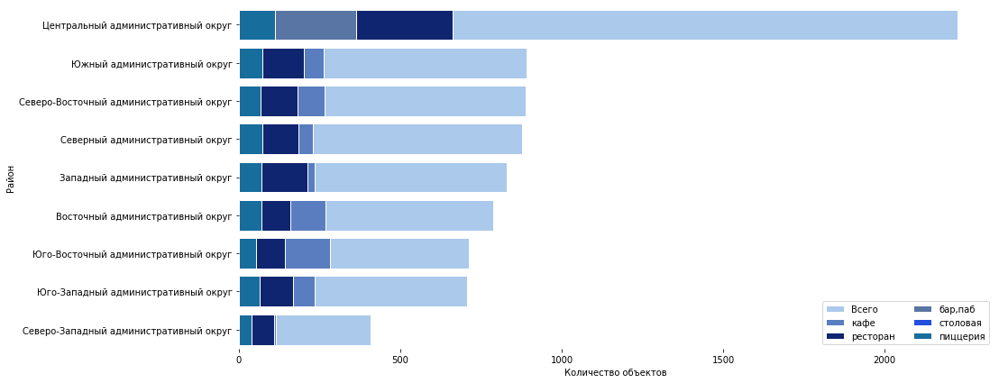

In [18]:
f, ax = plt.subplots(figsize = (15,7))
sns.set_color_codes('pastel')
sns.barplot(x = 'total', y = 'district', data = district_2,
            label = 'Всего', color = 'b', edgecolor = 'w')
sns.set_color_codes('muted')
sns.barplot(x = 'кафе', y = 'district', data = district_2,
            label = 'кафе', color = 'b', edgecolor = 'w')
sns.set_color_codes('dark')
sns.barplot(x = 'ресторан', y = 'district', data = district_2,
            label = 'ресторан', color = 'b', edgecolor = 'w')
sns.set_color_codes('deep')
sns.barplot(x = 'бар,паб', y = 'district', data = district_2,
            label = 'бар,паб', color = 'b', edgecolor = 'w')
sns.set_color_codes('bright')
sns.barplot(x = 'столовая', y = 'district', data = district_2,
            label = 'столовая', color = 'b', edgecolor = 'w')
sns.set_color_codes('colorblind')
sns.barplot(x = 'пиццерия', y = 'district', data = district_2,
            label = 'пиццерия', color = 'b', edgecolor = 'w')
ax.legend(ncol = 2, loc = 'lower right')
ax.set(ylabel="Район", xlabel="Количество объектов")
sns.despine(left = True, bottom = True)
plt.show()

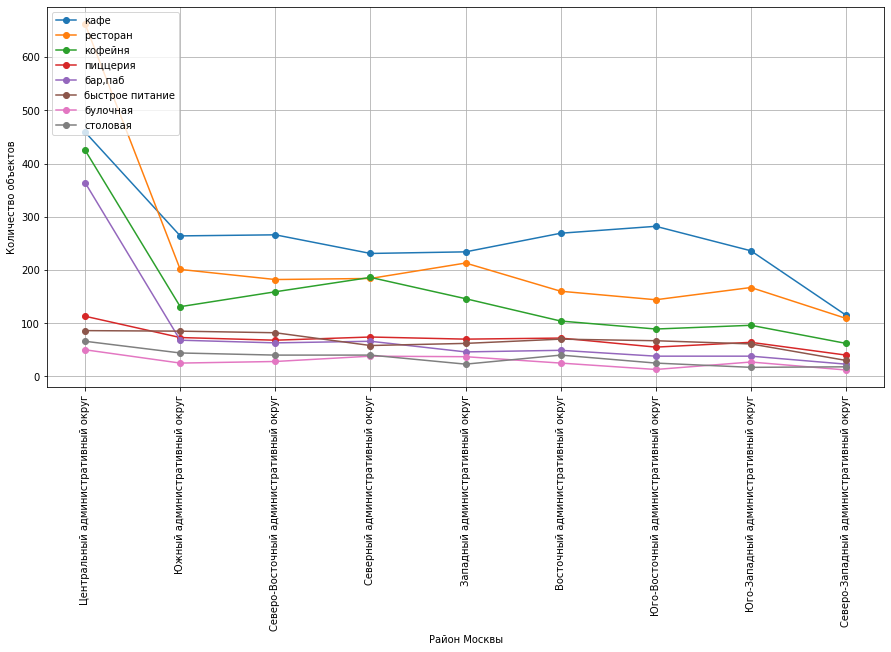

In [19]:
fig, ax = plt.subplots(figsize=(15, 7))

for i in list(data.category.unique()):
    ax.plot(district_2.district, district_2.loc[:, i], marker ='o', label=i)
plt.xticks(district_2.district)
plt.xlabel('Район Москвы')
plt.ylabel('Количество объектов')
plt.grid()
plt.legend(loc='upper left')
plt.xticks(rotation=90)
plt.show()

In [20]:
#Визуализируйте распределение средних рейтингов по категориям заведений. 
#Сильно ли различаются усреднённые рейтинги в разных типах общепита?
rating=data.pivot_table(index = ('category'), values='rating', aggfunc='mean').sort_values(by = 'rating',ascending = False).reset_index()
display (rating)

,category,rating
0,"бар,паб",4.390199
1,пиццерия,4.300636
2,ресторан,4.289318
3,кофейня,4.277253
4,булочная,4.267843
5,столовая,4.211821
6,кафе,4.123642
7,быстрое питание,4.049584


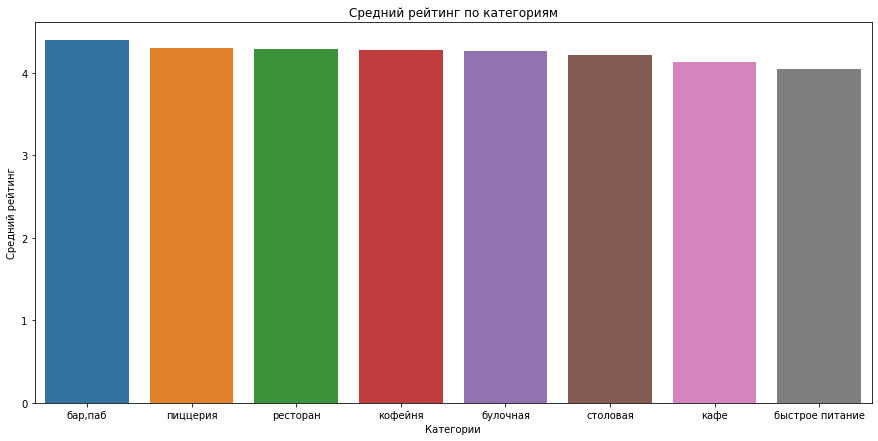

In [21]:
plt.figure(figsize=(15, 7))
ax=sns.barplot(x='category', y='rating', data=rating)
plt.title('Средний рейтинг по категориям')
plt.xlabel('Категории')
plt.ylabel('Средний рейтинг')
plt.show()

Средние рейтинги у всех категорий примерно одиннаковые.

In [22]:
#Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. 
#Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).
# импортируем карту и хороплет
rating_district=data.pivot_table(index = 'district', values='rating', aggfunc='mean').reset_index()
display (rating_district)
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

,district,rating
0,Восточный административный округ,4.174271
1,Западный административный округ,4.179904
2,Северный административный округ,4.238997
3,Северо-Восточный административный округ,4.148649
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377663
6,Юго-Восточный административный округ,4.100842
7,Юго-Западный административный округ,4.172521
8,Южный административный округ,4.184063


In [23]:
#Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

In [24]:
#Найдите топ-15 улиц по количеству заведений. 
#Постройте график распределения количества заведений и их категорий по этим улицам. 
#Попробуйте проиллюстрировать эту информацию одним графиком.
streets=data.pivot_table(index = 'street_name', values='name', aggfunc='count').sort_values(by='name', ascending=False).reset_index()
streets_top15=streets.head(15)
streets_top15
streets_2 = data.pivot_table(index = 'street_name', values='name', columns = 'category', aggfunc='count').reset_index()
streets_2['total']=streets_2['бар,паб']+streets_2['булочная']+streets_2['быстрое питание']+streets_2['кафе']+streets_2['кофейня']+streets_2['пиццерия']+streets_2['ресторан']+streets_2['столовая']
streets_2=streets_2.sort_values(by='total', ascending=False).head(15)
display (streets_2)

category,street_name,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
1090,проспект Мира,12.0,4.0,21.0,53.0,36.0,11.0,45.0,2.0,184.0
773,Профсоюзная улица,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0,122.0
525,Ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0,107.0
1087,проспект Вернадского,5.0,1.0,12.0,23.0,14.0,11.0,29.0,2.0,97.0
373,Дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0,88.0
523,Ленинградский проспект,13.0,3.0,2.0,8.0,18.0,6.0,20.0,2.0,72.0
524,Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0,70.0
517,Кутузовский проспект,2.0,1.0,2.0,14.0,13.0,3.0,16.0,2.0,53.0
170,Алтуфьевское шоссе,5.0,1.0,5.0,13.0,9.0,3.0,10.0,1.0,47.0
760,Пресненская набережная,5.0,1.0,1.0,10.0,6.0,1.0,18.0,2.0,44.0


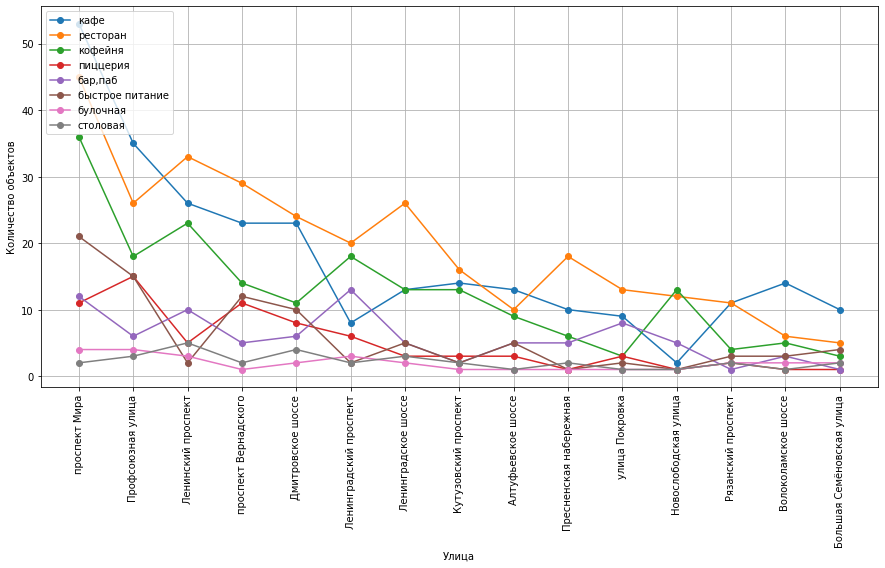

In [25]:
fig, ax = plt.subplots(figsize=(15, 7))

for i in list(data.category.unique()):
    ax.plot(streets_2.street_name, streets_2.loc[:, i], marker ='o', label=i)
plt.xticks(streets_2.street_name)
plt.xlabel('Улица')
plt.ylabel('Количество объектов')
plt.grid()
plt.legend(loc='upper left')
plt.xticks(rotation=90)
plt.show()

Больше всего заведений и оценок, ожидаемо, в центральном районе Москвы. Самая ресторанная улица Москвы - Проспект Мира.

In [26]:
#Найдите улицы, на которых находится только один объект общепита. 
#Что можно сказать об этих заведениях?
streets=data.pivot_table(index = 'street_name', values='name', aggfunc='count').sort_values(by='name', ascending=False).reset_index()
#display (streets)
streets=streets.query('name == 1')
display(streets)

,street_name,name
989,улица Капотня,1
990,улица Шкулёва,1
991,улица Костякова,1
992,улица Шухова,1
993,улица Фотиевой,1
...,...,...
1443,Отрадный проезд,1
1444,Павелецкая набережная,1
1445,Панкратьевский переулок,1
1446,Парусный проезд,1


459 улиц с одним заведением

In [27]:
streets_2= data.pivot_table(index = 'street_name', values='name', columns = 'category', aggfunc='count').reset_index()
streets_2['total']=streets_2['бар,паб']+streets_2['булочная']+streets_2['быстрое питание']+streets_2['кафе']+streets_2['кофейня']+streets_2['пиццерия']+streets_2['ресторан']+streets_2['столовая']
streets_3=streets_2.query('total == 1')
display (streets_3)

category,street_name,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total


In [28]:
#Значения средних чеков заведений хранятся в столбце middle_avg_bill. 
#Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. 
#Посчитайте медиану этого столбца для каждого района. 
#Используйте это значение в качестве ценового индикатора района. 
#Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. 
#Проанализируйте цены в центральном административном округе и других. 
#Как удалённость от центра влияет на цены в заведениях?
# импортируем карту и хороплет
price_district=data.pivot_table(index = 'district', values='middle_avg_bill', aggfunc='median').sort_values(by = 'middle_avg_bill', ascending = False).reset_index()
display (price_district)
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=price_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний счет заведений по районам',
).add_to(m)

# выводим карту
m

,district,middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,550.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


Самые высокие цены в центральнои округе, а так же в районах, где есть аэропорты.

Шаг 4. Детализируем исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.

Ответьте на следующие вопросы:
* 		Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
* 		Есть ли круглосуточные кофейни?
* 		Какие у кофеен рейтинги? Как они распределяются по районам?
* 		На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [29]:
data_step4=data.query('category=="кофейня"')
data_step4.info()
data_4=data_step4.pivot_table(index = 'district', values='name', aggfunc='count').sort_values(by='name', ascending=False).reset_index()
display (data_4)
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_4,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество заведений по районам',
).add_to(m)

# выводим карту
m

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1398 entries, 3 to 8400
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1398 non-null   object 
 1   category           1398 non-null   object 
 2   address            1398 non-null   object 
 3   district           1398 non-null   object 
 4   hours              1383 non-null   object 
 5   lat                1398 non-null   float64
 6   lng                1398 non-null   float64
 7   rating             1398 non-null   float64
 8   price              470 non-null    object 
 9   avg_bill           711 non-null    object 
 10  middle_avg_bill    196 non-null    float64
 11  middle_coffee_cup  515 non-null    float64
 12  chain              1398 non-null   int64  
 13  seats              1398 non-null   float64
 14  street_name        1398 non-null   object 
 15  is_24/7            1398 non-null   bool   
dtypes: bool(1), float64(6), 

,district,name
0,Центральный административный округ,425
1,Северный административный округ,186
2,Северо-Восточный административный округ,159
3,Западный административный округ,146
4,Южный административный округ,131
5,Восточный административный округ,104
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


Всего в датасете 1398 кофеен. Больше всего (около 1/3) в Центральном административном округе.

In [30]:
data_4_1=data_step4.pivot_table(index = 'is_24/7', values='name', aggfunc='count').reset_index()
display (data_4_1)

,is_24/7,name
0,False,1339
1,True,59


Всего в датасете 59 круглосуточных кофеен.

In [31]:
data_4_2=data_step4.pivot_table(index = 'district', values='rating', aggfunc='median').reset_index()
display (data_4_2)
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_4_2,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг кофеен по районам',
).add_to(m)

# выводим карту
m

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.2
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.3
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.3
6,Юго-Восточный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


Очень ровный рейтинг по районам. 

In [32]:
data_4_3=data_step4.pivot_table(index = 'district', values='middle_coffee_cup', aggfunc='median').sort_values(by = 'middle_coffee_cup', ascending = False).reset_index()
display (data_4_3)
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_4_3,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианная средняя цена чашки кофе по районам',
).add_to(m)

# выводим карту
m

,district,middle_coffee_cup
0,Юго-Западный административный округ,198.0
1,Центральный административный округ,190.0
2,Западный административный округ,187.0
3,Северо-Западный административный округ,165.0
4,Северо-Восточный административный округ,162.5
5,Северный административный округ,159.0
6,Южный административный округ,150.0
7,Юго-Восточный административный округ,147.5
8,Восточный административный округ,135.0


Выводы:
    1. Условий в задании недостаточно, чтобы ответить на поставленный вопрос : смогут ли инвесторы осуществить свою мечту - открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве.
    2. На основании имеющихся данных можно сказать, что необходимо глубже изучить Западный район Москвы: здесь относительно небольшое количество кофеен (возможно не активная конкуренция), высокий средний ценник за чашку кофе (возможна быстрая окупаемость бизнеса) и низкий рейтинг заведений (возможно не жесткая конкурентная среда).
    3. Для принятия решения об открытии кофейни необходимо изучить трафик движения потенциальных покупателей/посетителей, его временные изменения, портрет потребителя. На основе этих данных выбрать наиболее перспективные локации. В этих локациях уже оценить ближайших конкурентов (не только кофейни, но и рестораны, булочные и кафе), оценить возможные варианты размещения, потстроить цепочку поставок для оценки себестоимости, построить финансовую модель, оформить все это в бизнес-план. Скорее всего все эти пункты еще повторить несколько раз. И уже потом можно будет приблизиться к ответу на вопрос инвесторов.

новая презентпация https://cloud.mail.ru/public/gH8p/TnwoEBmaH